In [10]:
# TODO 
# for reprociblity set random seed -- it should be the last two digits of your student ID 

### Audio Modality: Classifying Respiratory Diseases

#### Objective
In this assignment, we will build a Convolutional Neural Network (CNN) to classify respiratory diseases from audio recordings.

We will use Mel-Frequency Cepstral Coefficients (MFCCs) as features extracted from a dataset of respiratory sounds to train our model.


#### Deliverables

-   A **clean Jupyter Notebook** with:
    -   Code cells (organized with headers), create cells whenever needed. 
    -   Outputs (EDA figures, evaluation reports, confusion matrices).
    -   Written answers to all reflection/discussion questions, create cells whenver needed (in markdown cells). 


### First Step 

We will use the Kaggle dataset **`Resiparotory Audio`**.  
Please download the dataset using this link: [Link](https://www.kaggle.com/datasets/vbookshelf/respiratory-sound-database)

In [1]:
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
audio_dir = "Respiratory_Sound_Database/Respiratory_Sound_Database/audio_and_txt_files"
diagnosis_path = "Respiratory_Sound_Database/Respiratory_Sound_Database/patient_diagnosis.csv"

wav_files = sorted([i for i in os.listdir(audio_dir) if i.endswith(".wav")])
txt_files = sorted([i for i in os.listdir(audio_dir) if i.endswith(".txt")])

### Exploring the Data (10 pts)


1. Play a few input samples and check for their related outputs (labels) 

In [5]:
import IPython.display as ipd

diagnosis_data = pd.read_csv(diagnosis_path, names = ["Patient Id", "Diagnosis"])

samples = random.sample(wav_files, 5)

for i in samples:
    patient_id = int(i.split("_")[0])

    diagnosis_row = diagnosis_data[diagnosis_data["Patient Id"] == patient_id]
    diagnosis = diagnosis_row["Diagnosis"].values[0] if not diagnosis_row.empty else "Unknown"

    file_path = os.path.join(audio_dir, i)
    y, sr = librosa.load(file_path, sr = None)

    print(f"File: {i}")
    print(f"Patient ID: {patient_id}")
    print(f"Diagnosis: {diagnosis}")

    ipd.display(ipd.Audio(y, rate = sr))

C:\Users\Anjana\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
C:\Users\Anjana\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
C:\Users\Anjana\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


File: 200_2p4_Pr_mc_AKGC417L.wav
Patient ID: 200
Diagnosis: COPD


File: 158_2p2_Ar_mc_AKGC417L.wav
Patient ID: 158
Diagnosis: COPD


File: 223_1b1_Ar_sc_Meditron.wav
Patient ID: 223
Diagnosis: COPD


File: 158_2p3_Lr_mc_AKGC417L.wav
Patient ID: 158
Diagnosis: COPD


File: 205_2b4_Pl_mc_AKGC417L.wav
Patient ID: 205
Diagnosis: COPD


2. Explain what input & ouput samples represent? 

The input samples represent the audio recordings (.wav files) of patient's respiratory sounds at different lung locations. The output samples represent the corresponding diagnosis such as "COPD", "Healthy", "Pnuemonia", etc. based on observing the breathing cycles and abnormal sounds in the recordings.

3. Report class distribution and discuss imbalance (e.g., using countplot). 

The below bar graph shows the class distribution of the number of samples belonging to the diagnosis classes. The number of samples with "COPD", "Healthy", and "URTI" classes are comparatively higher compared to all the other classes.

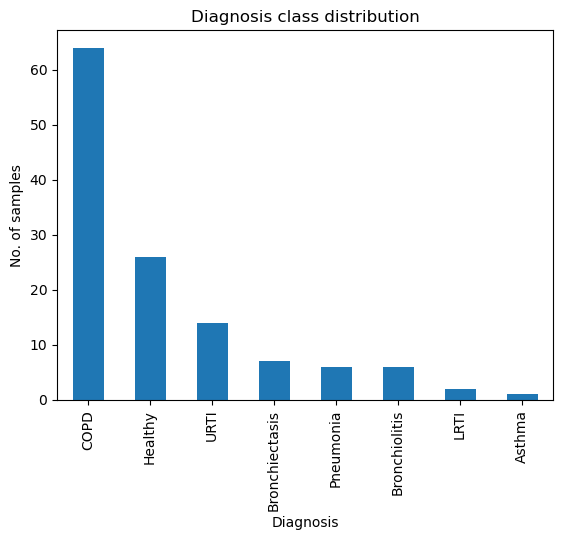

In [27]:
count = diagnosis_data["Diagnosis"].value_counts()

count.plot(kind = "bar")
plt.xlabel("Diagnosis")
plt.ylabel("No. of samples")
plt.title("Diagnosis class distribution")
plt.show()

#### Preprocessing (10 pts)

**Feature Extraction**

Mel-Frequency Cepstral Coefficients (MFCCs):
Since raw audio signals are complex, it is important to extract features that are more informative for a learning algorithm. MFCCs are widely used in audio tasks because they capture the short-term frequency spectrum in a way that aligns well with human auditory perception. This process transforms each audio file into a fixed-size representation suitable for model training.

> Hint: The librosa library provides built-in methods (e.g., librosa.load, librosa.feature.mfcc) that make audio loading and MFCC extraction straightforward.

1. Optional: check for any other related preprocessing which is necessary for this data (e.g., audio normalization, noise reduction, ...)
2. Split into train/test (e.g., 80/20), stratified by specialty.
   - For hyper-parameter tuning use 10% of training data as validation set. 

In [33]:
SR = 22050
DURATION = 8.0
N_SAMPLES = int(SR * DURATION)
N_MFCC = 40

def extract_mfcc(file_path, sr = SR, n_mfcc = N_MFCC):
    y, i = librosa.load(file_path, sr = sr)
    if len(y) < N_SAMPLES:
        y = np.pad(y, (0, N_SAMPLES - len(y)))
    else:
        y = y[:N_SAMPLES]
        
    mfcc = librosa.feature.mfcc(y = y, sr = sr, n_mfcc = n_mfcc)
    return np.mean(mfcc, axis = 1)

features = []
labels = []

for i in wav_files:
    patient_id = int(i.split("_")[0])
    diagnosis_row = diagnosis_data[diagnosis_data["Patient Id"] == patient_id]
    
    if diagnosis_row.empty:
        continue
        
    diagnosis = diagnosis_row["Diagnosis"].values[0]
    path = os.path.join(audio_dir, i)
    mfcc_features = extract_mfcc(path)
    features.append(mfcc_features)
    labels.append(diagnosis)

X = np.array(features)
y = np.array(labels)

le = LabelEncoder()
y_encoded = le.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size = 0.2, random_state = 74)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.1, random_state = 74)

Visualizes the MFCC features for a single audio sample from your dataset. 

* Describe what the x-axis, y-axis, and the color intensity each represent.
* Explain how the patterns in this visualization could be useful for the model trying to distinguish between different respiratory sounds (e.g. healthy vs. disease).

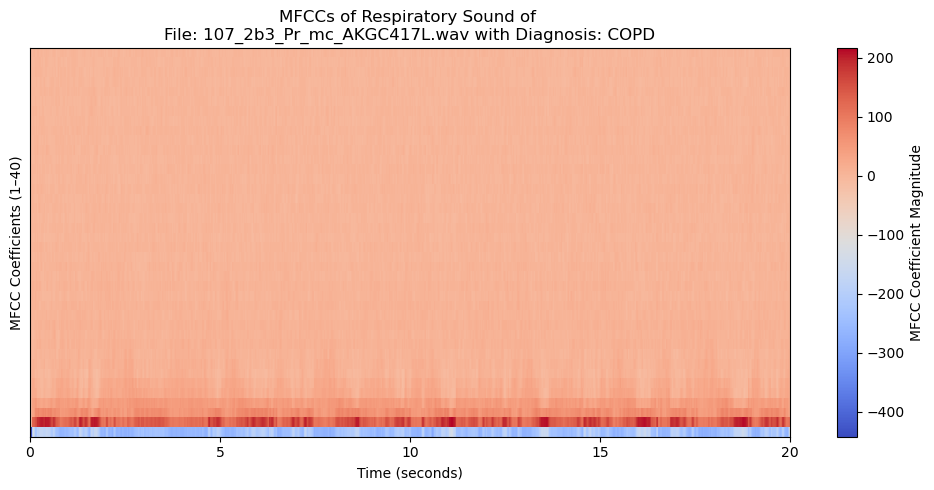

In [35]:
sample_file = random.choice(wav_files)
patient_id = int(sample_file.split("_")[0])
diagnosis_row = diagnosis_data[diagnosis_data["Patient Id"] == patient_id]
diagnosis = diagnosis_row["Diagnosis"].values[0] if not diagnosis_row.empty else "Unknown"

file_path = os.path.join(audio_dir, sample_file)

y, sr = librosa.load(file_path, sr = SR)
mfcc = librosa.feature.mfcc(y = y, sr = sr, n_mfcc = N_MFCC)

plt.figure(figsize = (10, 5))
librosa.display.specshow(mfcc, x_axis = "time", sr = sr)
plt.colorbar(label = "MFCC Coefficient Magnitude")
plt.title(f"MFCCs of Respiratory Sound of \nFile: {sample_file} with Diagnosis: {diagnosis}")
plt.xlabel("Time (seconds)")
plt.ylabel("MFCC Coefficients (1–40)")
plt.tight_layout()
plt.show()

The x-axis (time in seconds) represents how the repiratory sound changes with inhalation, exhalation, crackling, or wheezing across the time. The y-axis (MFCC coefficients) represents the frequency of breathing patterns where the lower coefficients (0 to 10) capture the low-frequency breathing patterns and the higher coefficients (20 to 40) capture fine-grained noise patterns. The bright (red) regions represent strong frequency while the darker (blue) regions represent weaker frequency.
These patterns will be useful for the model to classify repiratory sounds as "healthy" or "disease" as the MFCC patterns of "healthy" sounds are usually stable and consistent over time while the MFCC patterns of "disease" sounds have noise values which lead to irregular patterns.

### Classification Experiments (60)

### Experimental Design

### 1. Evaluation:
  -  Classification_report
  -  Confusion matrix plot   
  -  An ROC (Receiver Operating Characteristic) Curve for each class. The area under the curve (AUC) is a good measure of the model's ability to distinguish between classes. A higher AUC is better.


### 2. Methods: CNN 

Define a custom Convolutional Neural Network (CNN) for feature extraction followed by fully connected (Linear) classifier. 

> Hyperparameter-tuning: Perform hyperparameter tuning (e.g., number of epochs, learning rate, kernel size and stride, activation function, etc.) to improve performance and generalization. 

#### Methods: CNN

In [37]:
X_train_cnn = X_train.reshape(-1, 40, 1, 1)
X_val_cnn   = X_val.reshape(-1, 40, 1, 1)
X_test_cnn  = X_test.reshape(-1, 40, 1, 1)

num_classes = len(np.unique(y_train))

model = models.Sequential([
    layers.Conv2D(32, (3,1), activation = "relu", input_shape=(40,1,1)),
    layers.MaxPooling2D((2,1)),
    layers.Conv2D(64, (3,1), activation = "relu"),
    layers.MaxPooling2D((2,1)),
    layers.Flatten(),
    layers.Dense(64, activation = "relu"),
    layers.Dropout(0.3),
    layers.Dense(num_classes, activation = "softmax")
])

model.compile(optimizer = "adam", loss = "sparse_categorical_crossentropy", metrics = ["accuracy"])

model.summary()

C:\Users\Anjana\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 38, 1, 32)           │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 19, 1, 32)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 17, 1, 64)           │           6,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 8, 1, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │             520 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 39,688 (155.03 KB)

 Trainable params: 39,688 (155.03 KB)

 Non-trainable params: 0 (0.00 B)

In [39]:
history = model.fit(X_train_cnn, y_train, validation_data = (X_val_cnn, y_val), epochs = 25, batch_size = 16)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - accuracy: 0.7262 - loss: 1.9609 - val_accuracy: 0.8649 - val_loss: 0.5694
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8644 - loss: 0.6118 - val_accuracy: 0.8649 - val_loss: 0.4413
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8475 - loss: 0.5337 - val_accuracy: 0.8649 - val_loss: 0.4548
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8654 - loss: 0.4582 - val_accuracy: 0.8649 - val_loss: 0.4265
Epoch 5/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8510 - loss: 0.4721 - val_accuracy: 0.8784 - val_loss: 0.4072
Epoch 6/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8885 - loss: 0.3574 - val_accuracy: 0.8649 - val_loss: 0.3980
Epoch 7/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8898 - loss: 0.3618 - val_accuracy: 0.8784 - val_loss: 0.4076
Epoch 8/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8513 - loss: 0.4089 - val_accuracy: 0.9054 - v

#### Evaluation:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step 

Classification Report:
                precision    recall  f1-score   support

Bronchiectasis       1.00      0.50      0.67         2
          COPD       0.91      0.99      0.95       158
       Healthy       0.67      0.18      0.29        11
          LRTI       0.00      0.00      0.00         1
     Pneumonia       0.67      0.25      0.36         8
          URTI       0.25      0.25      0.25         4

      accuracy                           0.89       184
     macro avg       0.58      0.36      0.42       184
  weighted avg       0.86      0.89      0.86       184



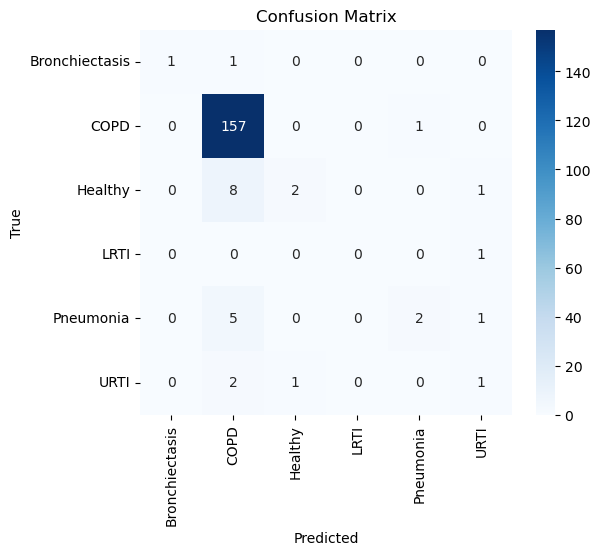

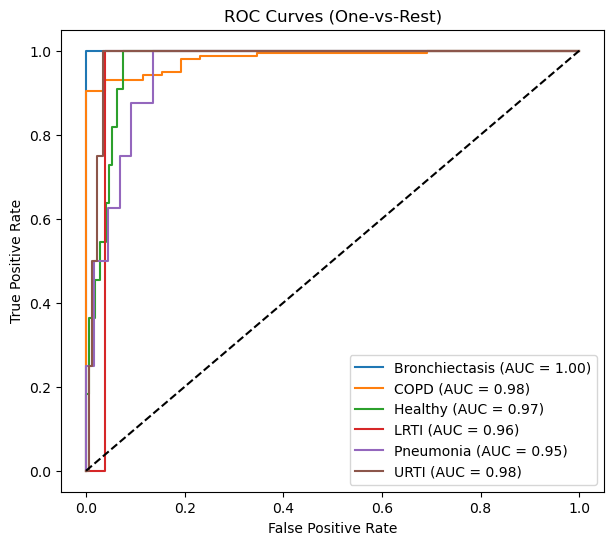

In [53]:
y_pred_probs = model.predict(X_test_cnn)
y_pred = np.argmax(y_pred_probs, axis=1)

unique_classes = np.unique(y_test)
class_names = le.inverse_transform(unique_classes)

print("\nClassification Report:")
print(classification_report(y_test, y_pred, labels = unique_classes, target_names = class_names, zero_division = 0))

cm = confusion_matrix(y_test, y_pred, labels = unique_classes)

plt.figure(figsize = (6,5))
sns.heatmap(cm, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

y_test_bin = label_binarize(y_test, classes = unique_classes)

plt.figure(figsize = (7,6))

for i, cls in enumerate(class_names):
    fpr, tpr, i = roc_curve(y_test_bin[:, i], y_pred_probs[:, unique_classes[i]])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label = f"{cls} (AUC = {roc_auc:.2f})")

plt.plot([0,1], [0,1], "k--")
plt.title("ROC Curves (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

### Discussion (20)

After completing experiments, answer:

1. How does the model perform for the diseases with lower number of samples? 

> If yes, analyze and explain **two potential reasons** why the model struggles to accurately predict the less common diseases, leading to lower precision and recall for those specific classes

The model does not perform well for the diseases with lower number of samples ("Bronchiolitis", "URTI", "LRTI", and "Asthma") as the model does not see those samples as often compared to the classes with large number of samples ("COPD" and "Healthy") and it becomes biased toward these classes. This class imbalance leads to the model optimizing its weights for frequent labels which leads to low precision and recall for rare diseases ("Bronchiolitis", "URTI", "LRTI", and "Asthma"). The limited number of samples belonging to these less common diseases cannot capture the important features for the model to be able to identify the MFCC features of those diseases. Therefore, the model will not be able to accurately predict these less common diseases leading to low precision and recall values.